# LAYER Framework: Hunting BYOVD Implementations

## Workshop Overview

**Scenario**: You are tasked with: **"Hunt for BYOVD attacks in our environment?"**

You have:
- Event logs (Sysmon, Kernel providers, etc.)

- General knowledge that BYOVD = "Bring Your Own Vulnerable Driver"

- Enthusiasm to hunt threats

**The Problem**: Where do you even start? And why is it "complicated"?

### In This Workshop You'll Learn:

1. **Why "hunt for BYOVD" is too vague** (and leads to brittle detections)

2. **The LAYER Framework** - A Structured approach that can be picked from any layer

3. **How to identify procedural patterns** that survive tool variations

4. **Building modular hunt packages** that are reusable

5. **Telemetry mapping** across multiple providers

### The LAYER Framework:

```
STRATEGIC "Campaign Context"    ← Why is this happening in the kill chain?

TACTICAL                        ← What objective does it serve? (MITRE Tactic)

TECHNIQUE                       ← How is the objective achieved? (MITRE Technique)

PROCEDURAL "Behavior"           ← What observable behavior patterns occur?

OPERATIONAL "Logic"             ← What compound operations facilitate behavior?

IMPLEMENTATION                  ← What code patterns (step-by-step) are used?
"Code Implementation" 

API FUNCTIONS                   ← What system-level actions are made? (APIs, syscalls, artifacts)
 "System Primitives" 
```

**Key Insight**: We don't hunt for "BYOVD". We hunt for **EDR Process Termination via Kernel Mode**, which happens to use BYOVD as an implementation detail.

---

## Setup: Load Toolkit and Data

In [2]:
# Import required modules
from threat_hunting_toolkit import ThreatHunter
from driver_correlation_engine import add_driver_correlation_to_hunter
from process_investigation_workbook import ProcessInvestigationWorkbook
from multi_correlation_engine import add_multi_correlation_to_hunter

# Fix: Import defaultdict properly
from collections import defaultdict, Counter
import json
import pandas as pd

print("Loading event data...")
hunter = ThreatHunter('BYOVD_SS_MSNT_SystemTrace_REMOVED.json', auto_analyze=False)

# Add correlation capabilities
add_driver_correlation_to_hunter(hunter)
add_multi_correlation_to_hunter(hunter)

print(f"\n✓ Loaded {len(hunter.data):,} events")
print("✓ Correlation engines ready")

Loading event data...
THREAT HUNTING TOOLKIT
[*] Loading: BYOVD_SS_MSNT_SystemTrace_REMOVED.json
[*] Loading as JSONL...
[+] Loaded JSONL: 5,322 records
[+] Added driver correlation capabilities to hunter
    • hunter.correlate_driver_load_chain(debug=True)
    • hunter.debug_path_matching()
    • hunter.export_driver_chains(chains, 'output.json')
[+] Added multi-correlation capabilities to hunter
    • hunter.correlate_process_file_registry()
    • hunter.correlate_registry_service()
    • hunter.correlate_process_registry_imageload()
    • hunter.custom_correlation()

✓ Loaded 5,322 events
✓ Correlation engines ready


---

# Part 1: The Problem - Starting with "Hunt for BYOVD"

## Question 1: What does "BYOVD" even mean for Hunting?

Let's see what MITRE ATT&CK tells us about BYOVD:

Check the **LOLDrivers** list (250+ drivers) - amazing project that has just turned into an IOC checklist

**"Which ones do we hunt?"**

**"All of them? None of them?** **HOW?**

# **LAYER** - Quick intro

**Strategic**: Ransomware needs to blind defenders

**Tactical**: Defense Evasion (T1562.001)

**Technique**: BYOVD

**Procedural**: Drop/Load_vulnerable_driver --> Process_Discovery --> EDR_Process_Termination - occurs in sequence

**Operational**: Terminate EDR process

**Implementation**: Service registration patterns

**API**: CreateService, DeviceIoControl, ZwTerminate

## **LAYER in Action**

**What is a common detection or "hunt" we see other than LoLDrivers' IOC list?**

    - Hunt for .sys files?

**Let's check**

1. Change any .sys to any extension you want?

2. Register it using sc command 

    ```sc create change_to_dll type= kernel binPath= C:\Path\To\Driver\SYS_CHANGED_TO.DLL```

   
    ```sc start change_to_dll```


```
╔═══════════════════════════════════════════════════════════════╗
║  THE REAL COST OF HUNTING "BYOVD"                             ║
╠═══════════════════════════════════════════════════════════════╣
║ Scenario: Ransomware operator using BYOVD                     ║
║                                                               ║
║ Some Hunt Approaches:                                         ║
║   ✓ Day 1: Detect AuKill (PROCEXP.SYS or hash)                ║
║   ✗ Day 2: Attacker changes to RTCore64.sys → MISSED          ║
║   ✗ Day 3: Write a new rule based on the signature            ║
║   ✗ Day 4: Attacker used newly found gdrv.sys → MISSED AGAIN  ║
║   Time spent: updating rules                                  ║ 
║   Result: We are playing catch in being proactive             ║
║ LAYER Approach:                                               ║
║   Hunt for: Service registration + Driver load + Process enum ║
║   Result: Catches AuKill, EDRSilencer, Terminator, unknowns   ║
║   Evasion: Must change Windows mechanisms (Impose Cose)       ║
║   Coverage: Most who use this implementation. For the ones    ║
║             That's what we will be able to create a dashboard ║
║             or automation to inform us                        ║
║LAYER Approach:                                                ║
║   ✓ Day 1: Someone exploiting a new driver                    ║
║   ✓ Day 2: Hunt termination procedure (same implementation)   ║
║   ~ Day 3: Termination by PPL Stripping (Partly observed)     ║
║   x Day 4: EDR Memory corruption(different hunt and telemetry)║
║   Time spent: Trying to find new telemetry and hunt           ║
║   Result: Catch variants and find what matters gaps           ║
║                                                               ║
║ The procedure stays part or completely constant.              ║
║  The tools change. Hunt for procedures, not tools.            ║
╚═══════════════════════════════════════════════════════════════╝

```
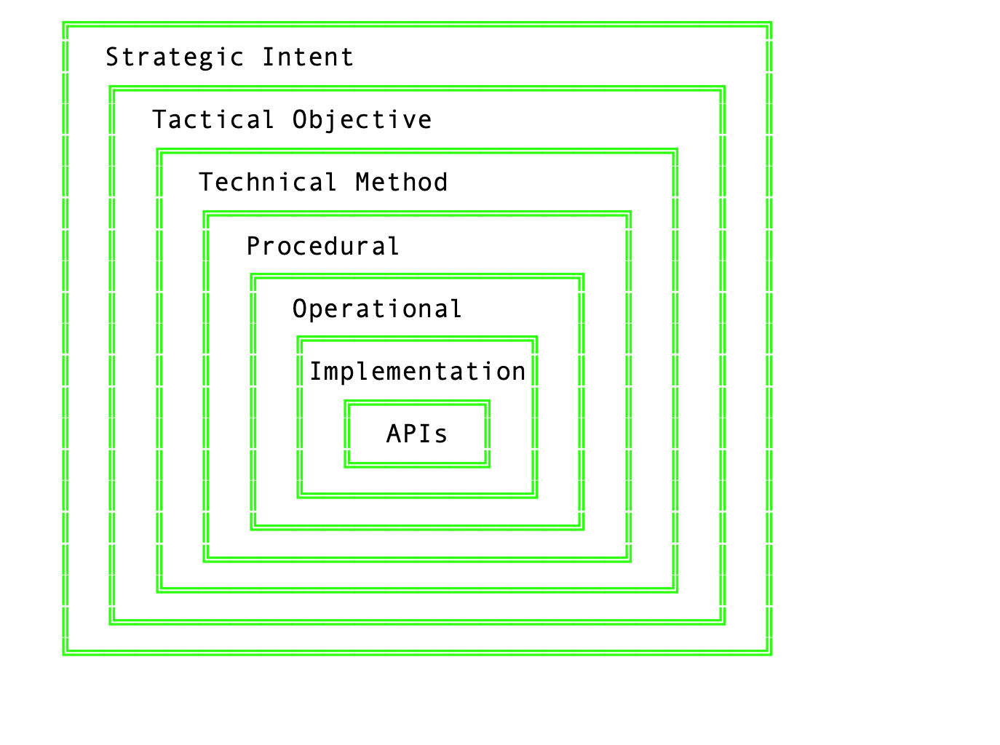

# Part 2: The LAYER Framework Approach

## Step 1: Pick ONE Implementation

Instead of hunting "BYOVD in general", we hunt for:

**"EDR Process Termination via Kernel-Mode Driver Abuse"**

This is used by:
- AuKill (BlackBasta)

- EDRSilencer

- Terminator

- PPLKiller

### EDR Process Termination Typical Implementation 

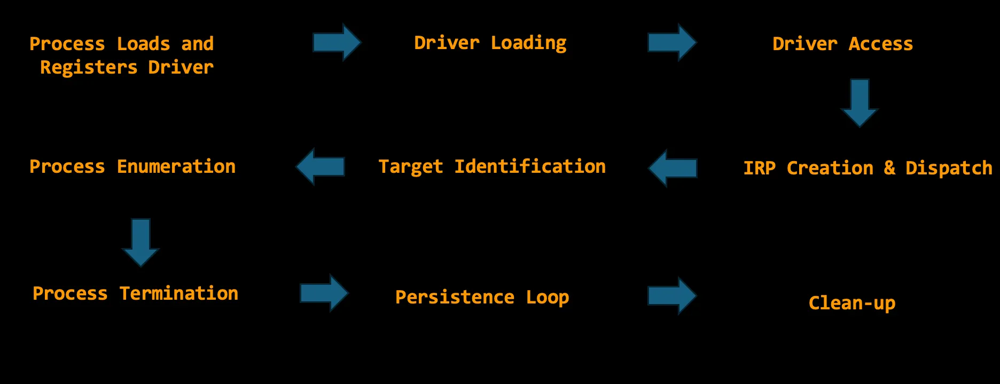

### PROCEDURAL PATTERN (What happens):

```
PROCEDURE EDR_Process_Termination
	PERFORM Process_Discovery
    		RESULT: discovered_EDR/AV Name   List
  	PERFORM Load_Vulnerable_Driver
    		Drop/locate driver file
    		Install and start driver as service
  		FOR EACH process IN discovered_EDR_processes
      			PERFORM Kill_EDR_Process
      			END FOR
  	PERFORM Cleanup_Artifacts
    		RESULT: Remove_Load_Vulnerable_Driver
END PROCEDURE
```


---

# Part 3: Understanding Our Telemetry

## Question: What data do we have?

## Use these questions to guide your investigation

1. Get an understanding of the providers and the volume of logs we have

    1. How many providers do we have?
       
    2. How many different events do we have for each provider?

2. Can you find signs of suspicious driver or service activity? Where? Which logs?

    #### Gathering Driver information
       
        1. Can you identify the driver registered by Nsec-Killer.exe?
   
        2. What are the logs associated with that driver?
      
        3. How does the process spawned by the driver(Nsec-Killer) and Registry logs correlate?

        4. Which service is installed?
      
        5. Are there any registry keys associated with that service?
      
        6. Will a service installation always be paired with an associated registry key?
      
        7. Bonus: NotifyRoutineAddress refers to a kernel-mode callback function address. Usually, this means a driver (often a legitimate or malicious one) has registered a function to be notified of specific events such as process creation, image loading, thread creation, registry changes, or other OS internals.

## LAYERing at this stage:
    1. Technique Layer: 
        Persistence (TA0003)
               └─ T1543.003: Create or Modify System Process was observed using Windows Registry key operations and driver/service install                        artifact.
    
    2. Operational Layer: This event often marks the moment a new (potentially vulnerable) driver is registered for subsequent loading.
    
    3. Procedural Layer: Part of "Drop & Register Driver" in BYOVD playbook:
    
        1. Drop/locate file
        
        2. Register as a service
        
        3. Set metadata in registry
        
    4.  Follow-up Investigation
    
        1. Correlate with:
        
            1. File Create 
            
            2. Service Install/Start events (Sysmon 13/EventLog 7045)
            
            3. Any image load associated with this service (Sysmon 7/6)
            
            4. Process activities linked to registry creation and service launch

In [ ]:
# Get data overview
overview = hunter.overview()

### Map Telemetry to Procedural Steps

We're about to dive into hunt packages. Remember: each package

represents ONE step in the adversary's PROCEDURE. The procedure 

is what survives tool variations.


---

# Part 4: Driver File Drop

## Hunt for .sys files in suspicious locations (**Please tell me why this is NOT entirely accurate**)

*Mark Twain*: **"The most dangerous thing is not what don't know, it is what you know for sure that simply ain't true"**

In [3]:
suspicious_locations = ['users', 'downloads', 'temp', 'appdata']
sys_files = hunter.file_operations(file_filter='.sys')
suspicious_sys_files = [f for f in sys_files if any(loc in (f.get('file_name') or '').lower() for loc in suspicious_locations)]
print(f"\nSuspicious .sys files in user-writable locations: {len(suspicious_sys_files)}")
for i, f in enumerate(suspicious_sys_files[:5], 1): print(f"{i}. File: {f.get('file_name')}, PID: {f.get('process_id')}")


FILE OPERATIONS
Filtered by: .sys
Total operations: 441
Unique files: 46

Top 10 Most Accessed Files:
       3x - ...\HarddiskVolume2\Users\cyb3r\Downloads\NSecKrnl.sys:Zone.Identifier
       1x - \Device\HarddiskVolume2\Windows\System32\drivers\clfs.sys
       1x - \Device\HarddiskVolume2\Windows\System32\drivers\tm.sys
       1x - \Device\HarddiskVolume2\Windows\System32\drivers\msrpc.sys
       1x - \Device\HarddiskVolume2\Windows\System32\drivers\ksecdd.sys
       1x - \Device\HarddiskVolume2\Windows\System32\drivers\ClipSp.sys
       1x - \Device\HarddiskVolume2\Windows\System32\drivers\werkernel.sys
       1x - \Device\HarddiskVolume2\Windows\System32\drivers\ntosext.sys
       1x - \Device\HarddiskVolume2\Windows\System32\drivers\WdfLdr.sys
       1x - \Device\HarddiskVolume2\Windows\System32\drivers\WppRecorder.sys

Processes accessing files: [4, 652, 756, 2176, 2648, 3856]

Suspicious .sys files in user-writable locations: 3
1. File: \Device\HarddiskVolume2\Users\cyb3r\Downlo

---

# Part 5: Service Registration

## Hunt for service registration with suspicious ImagePath

---

# Driver Load Chain - Not complete

In [4]:
from collections import defaultdict
print("--- HUNT PACKAGE 3: Complete Driver Load Chain Correlation ---")
driver_results = hunter.correlate_driver_load_chain(debug=False)
if driver_results['total'] > 0:
    for i, chain in enumerate(driver_results['chains'], 1): print(f"\nChain {i}: {chain['service_name']}\n  Driver: {chain['driver_path']}\n  ✓ Packages Matched: " + ("P1 " if chain['file_events'] else "") + ("P2 " if chain['registry_events'] else "") + ("P3 " if chain['driver_load_events'] else "") + ("P4" if chain['code_integrity_events'] else ""))
else:
    print("--- MANUAL HUNT ---"); provider_events = defaultdict(lambda: defaultdict(int))
    for event in hunter.search('nsec', display_limit=0):
        f = hunter._extract_fields(event); p, e, t = f.get('provider_name'), f.get('event_id'), f.get('task_name')
        if p and e: provider_events[p][f"Event {e}: {t}"] += 1
    for p, e in sorted(provider_events.items()): print(f"\n{p}:"); [print(f"  {count:>3}x {desc}") for desc, count in sorted(e.items())]

--- HUNT PACKAGE 3: Complete Driver Load Chain Correlation ---
DRIVER LOAD CORRELATION
[+] Found 1 driver service registrations
[+] Built 1 complete correlation chains

CORRELATION CHAINS

Chain 1: NSecKrnl

📍 Driver: \??\c:\Users\cyb3r\Downloads\NSecKrnl.sys
📍 Filename: c
📍 Total correlated events: 8

[BASE] Registry Service Creation:
  Event: Sysmon Event 13 (Registry value set)
  Timestamp: 2025-10-30 03:47:33Z
  ProcessGuid: {39898580-DB6A-6902-0B00-000000000300}
  Registry Key: HKLM\System\CurrentControlSet\Services\NSecKrnl\ImagePath

[REGISTRY] Related Registry Operations: 6
  • Event 12: CreateKey - HKLM\System\CurrentControlSet\Services\NSecKrnl
  • Event 13: SetValue - HKLM\System\CurrentControlSet\Services\NSecKrnl\Type
    Value: DWORD (0x00000001)
  • Event 13: SetValue - HKLM\System\CurrentControlSet\Services\NSecKrnl\Start
    Value: DWORD (0x00000002)
  • Event 13: SetValue - HKLM\System\CurrentControlSet\Services\NSecKrnl\ErrorControl
    Value: DWORD (0x00000001)
  • 

---

# Driver Load Chain - Complete

In [5]:
from collections import defaultdict
imagepath_analysis = defaultdict(list)
suspicious_non_sys = []
suspicious_locations = ['users', 'downloads', 'temp', 'appdata']

for op in hunter.registry_operations(key_filter='Services'):
    key, data_str = (op.get('key_name') or '').lower(), str(op.get('data') or '').lower()
    if 'imagepath' not in key or not data_str: continue
    
    filename = data_str.split('\\')[-1].split('/')[-1]
    ext = ('.' + filename.split('.')[-1].strip()) if '.' in filename else 'no_extension'
    
    entry = { 'key': op.get('key_name'), 'path': op.get('data'), 'pid': op.get('process_id'), 
              'timestamp': op.get('timestamp'), 'event_type': op.get('event_type'), 'detected_ext': ext }
              
    imagepath_analysis[ext].append(entry)
    
    if ext != '.sys' and any(loc in data_str for loc in suspicious_locations):
        suspicious_non_sys.append(entry)

# Display statistics
print("--- FILE EXTENSION DISTRIBUTION ---")
for ext, entries in imagepath_analysis.items(): print(f"{ext:>15}: {len(entries):>4} entries")

# Show non-.sys entries
print(f"\n--- Found {len(suspicious_non_sys)} suspicious non-.sys service binaries ---")
for i, item in enumerate(suspicious_non_sys, 1):
    print(f"\n{i}. Ext: {item['detected_ext']}\n   Key: {item['key']}\n   ImagePath: {item['path']}\n   PID: {item['pid']}")


REGISTRY OPERATIONS
Filtered by: Services
Total operations: 716
Unique registry keys: 12

Top 10 Most Accessed Keys:
      12x - HKLM\System\CurrentControlSet\Services\Tcpip\Parameters
       1x - HKLM\System\CurrentControlSet\Services\NSecKrnl
       1x - HKLM\System\CurrentControlSet\Services\NSecKrnl\Type
       1x - HKLM\System\CurrentControlSet\Services\NSecKrnl\Start
       1x - HKLM\System\CurrentControlSet\Services\NSecKrnl\ErrorControl
       1x - HKLM\System\CurrentControlSet\Services\NSecKrnl\ImagePath
       1x - HKLM\System\CurrentControlSet\Services\NSecKrnl\DisplayName
       1x - HKLM\System\CurrentControlSet\Services\changed_to_exe
       1x - HKLM\System\CurrentControlSet\Services\changed_to_exe\Type
       1x - HKLM\System\CurrentControlSet\Services\changed_to_exe\Start

Processes accessing registry: [652, 756, 2648, 3528, 3856]
--- FILE EXTENSION DISTRIBUTION ---
           .sys:    1 entries
           .exe:    1 entries

--- Found 1 suspicious non-.sys service bi

---

# Part 7: Process Enumeration

## Look for suspicious process access patterns

In [6]:
print("--- HUNT PACKAGE 4: EDR Process Enumeration ---")
edr_indicators = ['defender', 'carbon', 'crowdstrike', 'sentinel', 'cylance', 'sophos', 'kaspersky', 'mcafee', 'symantec', 'trend', 'eset', 'bitdefender','msmpeng', 'avast', 'avg']
edr_access_attempts = [
    {'source': (e.get('properties', {}).get('SourceImage') or '').lower(), 'target': (e.get('properties', {}).get('TargetImage') or '').lower(), 'access': e.get('properties', {}).get('GrantedAccess', ''), 'timestamp': hunter._extract_fields(e).get('timestamp')}
    for e in hunter.search(event_id=10, display_limit=0) if any(edr in (e.get('properties', {}).get('TargetImage') or '').lower() for edr in edr_indicators)
]
print(f"\nEDR/AV process access attempts: {len(edr_access_attempts)}")
for i, a in enumerate(edr_access_attempts[:5], 1): print(f"\n{i}. Source: {a['source']}\n   Target: {a['target']}\n   Access: {a['access']}")

--- HUNT PACKAGE 4: EDR Process Enumeration ---

[*] Found 262 matching events
[*] Showing first 0 of 262 results

... and 262 more results not displayed

EDR/AV process access attempts: 7

1. Source: c:\windows\system32\svchost.exe
   Target: c:\program files\windows defender\msmpeng.exe
   Access: 00100000

2. Source: c:\windows\system32\svchost.exe
   Target: c:\program files\windows defender\msmpeng.exe
   Access: 00100000

3. Source: c:\windows\system32\svchost.exe
   Target: c:\program files\windows defender\msmpeng.exe
   Access: 00100000

4. Source: c:\windows\system32\svchost.exe
   Target: c:\program files\windows defender\msmpeng.exe
   Access: 00100000

5. Source: c:\windows\system32\svchost.exe
   Target: c:\program files\windows defender\msmpeng.exe
   Access: 00100000


---

# Part 8: Deep Dive - Process Investigation

In [ ]:
print("\n" + "="*80)
print("DEEP INVESTIGATION: Complete Process Activity")
print("="*80)

# Use process investigation workbook
workbook = ProcessInvestigationWorkbook(hunter)
investigation = workbook.investigate_process_name('nsec', export_report=False)

---

# Part 9: Manual Hunt Package Correlation

In [8]:
print("\n" + "="*80)
print("MANUAL CORRELATION: Connecting the Dots")
print("="*80)

# 1. Find process creation events
nsec_process_events = [
    {
        'event': event, 'image': props.get('Image'), 'pid': props.get('ProcessId'),
        'guid': props.get('ProcessGuid'), 'cmdline': props.get('CommandLine'),
        'parent': props.get('ParentImage'), 'timestamp': hunter._extract_fields(event).get('timestamp')
    }
    for event in hunter.data
    if (fields := hunter._extract_fields(event)).get('event_id') == 1 and 'nsec' in (props := event.get('properties', {})).get('Image', '').lower()
]

# 2. Print results and correlate
if nsec_process_events:
    print(f"✓ Found {len(nsec_process_events)} nsec-killer process(es)")
    for proc in nsec_process_events:
        print(f"\n  Image: {proc['image']}\n  PID: {proc['pid']}\n  GUID: {proc['guid']}\n  CommandLine: {proc['cmdline']}\n  Parent: {proc['parent']}\n  Time: {proc['timestamp']}")
        print(f"\n  Correlating with hunt packages...")
        if 'suspicious_sys_files' in locals() and suspicious_sys_files: print(f"  ✓ Package 1: Found {len(suspicious_sys_files)} suspicious .sys files")
        if 'driver_services' in locals() and driver_services: print(f"  ✓ Package 2: Found {len(driver_services)} driver service registrations")
        if (driver_loads := hunter.search(event_id=6, display_limit=0)): print(f"  ✓ Package 3: Found {len(driver_loads)} driver load events")
        if 'edr_access_attempts' in locals() and edr_access_attempts: print(f"  ✓ Package 4: Found {len(edr_access_attempts)} EDR access attempts")
else:
    print("  No nsec-killer process creation events found.\n  (Telemetry may have started after, name is different, or EID 1 not logged)")


MANUAL CORRELATION: Connecting the Dots
✓ Found 1 nsec-killer process(es)

  Image: C:\Users\cyb3r\Downloads\NSec-Killer.exe
  PID: 6872
  GUID: {39898580-DFD5-6902-0001-000000000300}
  CommandLine: NSec-Killer.exe  -n msmpeng.exe
  Parent: C:\Windows\System32\cmd.exe
  Time: 2025-10-30 03:47:33Z

  Correlating with hunt packages...
  ✓ Package 1: Found 3 suspicious .sys files

[*] Found 38 matching events
[*] Showing first 0 of 38 results

... and 38 more results not displayed
  ✓ Package 3: Found 38 driver load events
  ✓ Package 4: Found 7 EDR access attempts


---

# Part 10: LAYER Framework Mapping

---

# Part 11: Converting LAYER Hunt to Detection Logic


# Part 12: Key Takeaways

---

# Part 13: Export Hunt Results

In [ ]:
# Export findings
hunt_results = {
    'detection_score': detection_score,
    'alert_level': alert_level,
    'matched_packages': matched_packages,
    'suspicious_sys_files': len(suspicious_sys_files),
    'driver_services': len(driver_services),
    'edr_access_attempts': len(edr_access_attempts),
    'timestamp': str(datetime.now())
}

with open('byovd_hunt_results.json', 'w') as f:
    json.dump(hunt_results, f, indent=2)

print("\n" + "="*80)
print("WORKSHOP COMPLETE")
print("="*80)
print("\n✓ Hunt results exported to: byovd_hunt_results.json")
print("✓ LAYER framework demonstrated")
print("✓ Hunt packages created and tested")
print("✓ Detection logic applied")

print("\n You now have a framework for hunting ANY technique!")

# LAYER it Everywhere

**Can you apply LAYER to OTHER techniques in EDR bypass**:

## Template

1. Start at Tactical (MITRE tactic)

2. Identify Technique (MITRE technique)

3. Define Procedure (sequence of operations)

4. Map to Operational (compound functions)

5. Identify Implementation (code patterns) - 

6. Document APIs (system calls) - Read a blog as many show APIs by reversing OR ask your Malware analyst, ya , we are not hunting like a made wolf. 

7. Build hunt packages or reuse some of the ones we have


# Artifacts you might find:

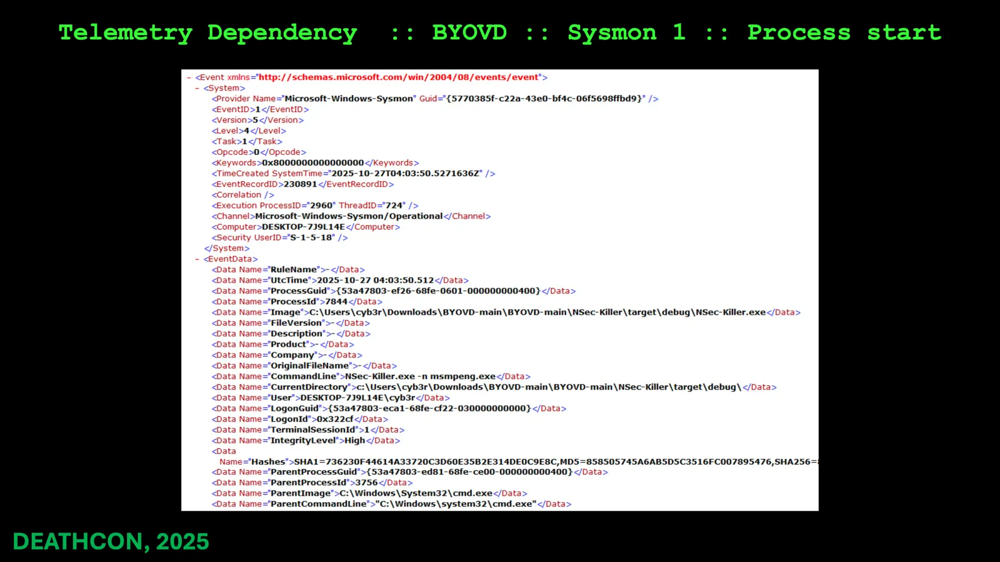
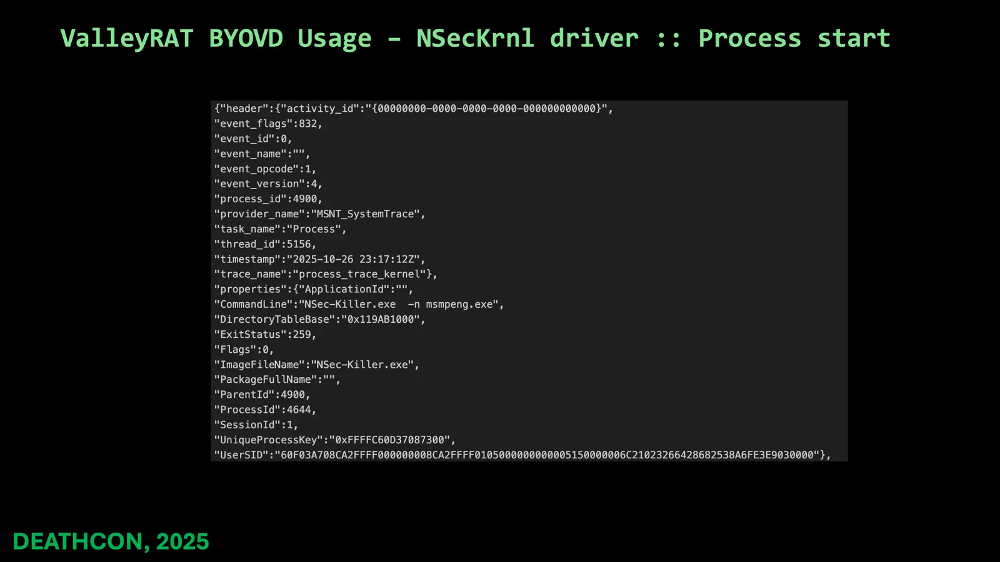
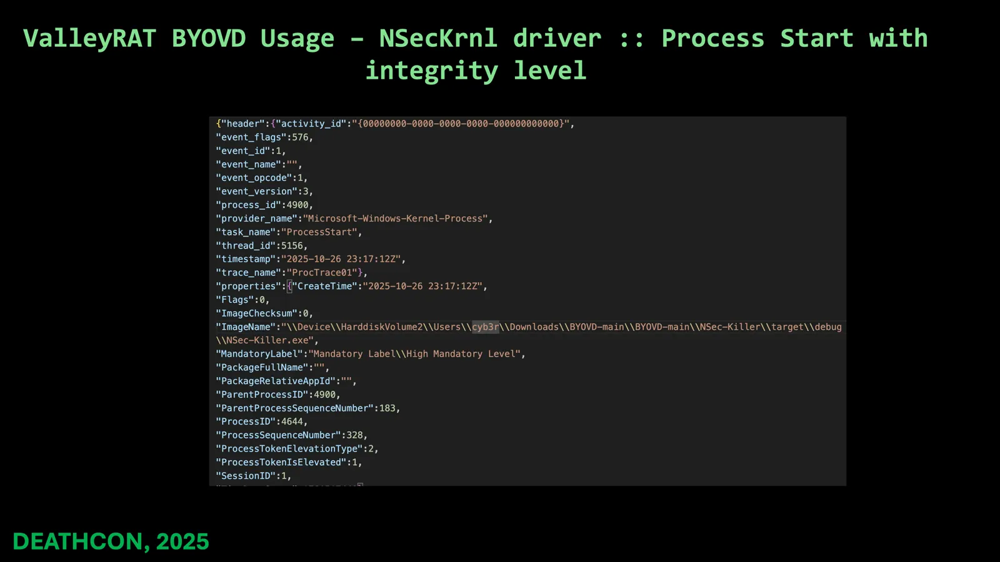
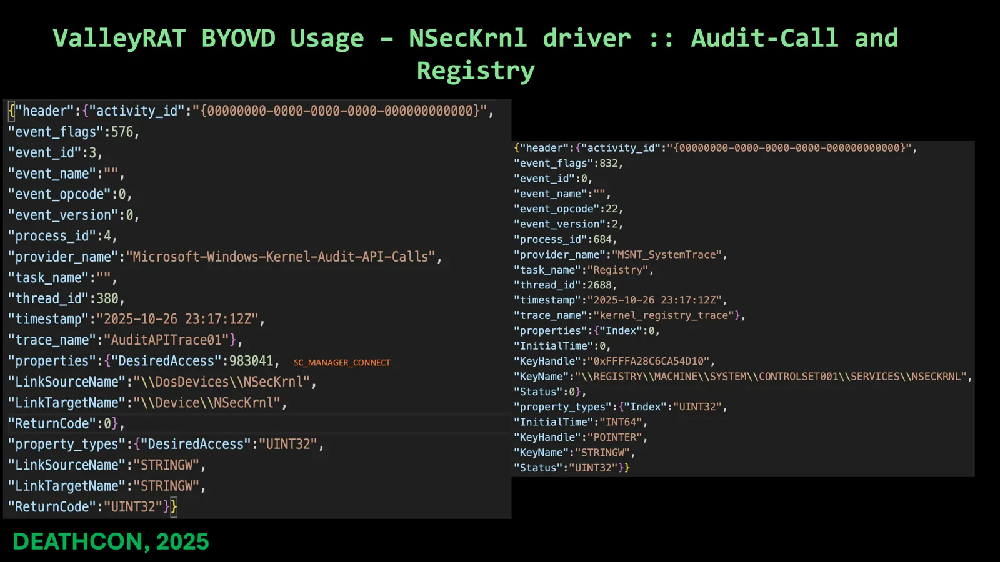
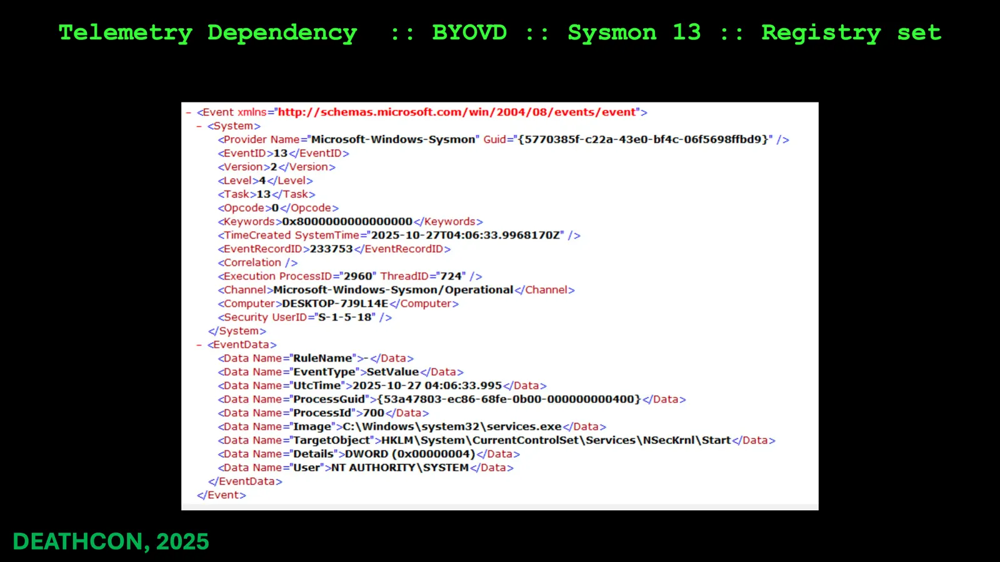
...
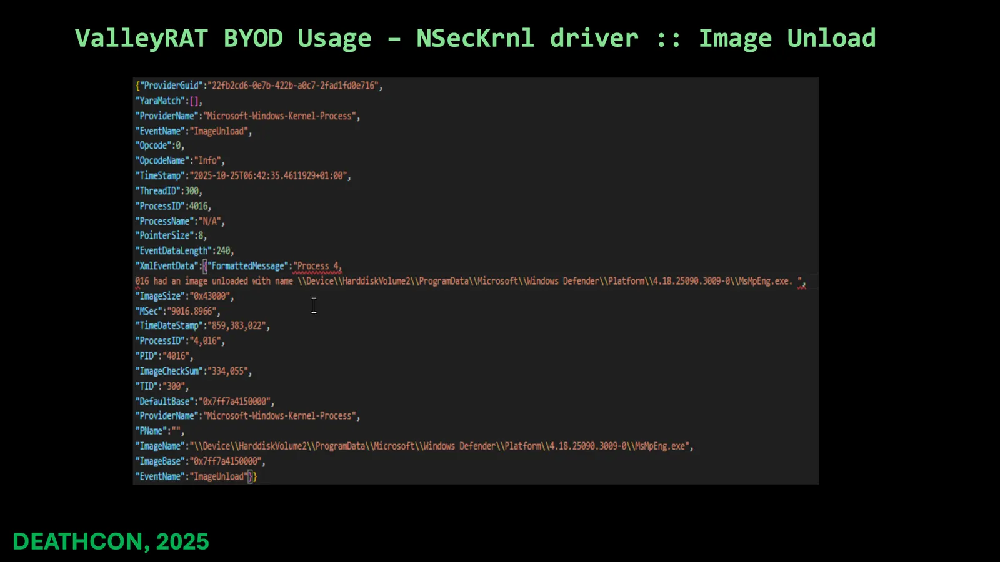
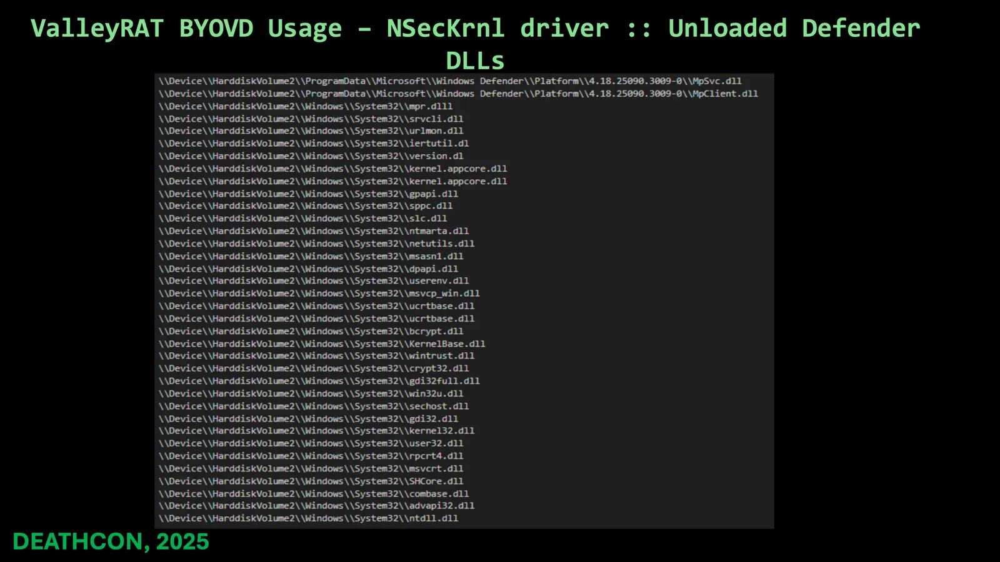
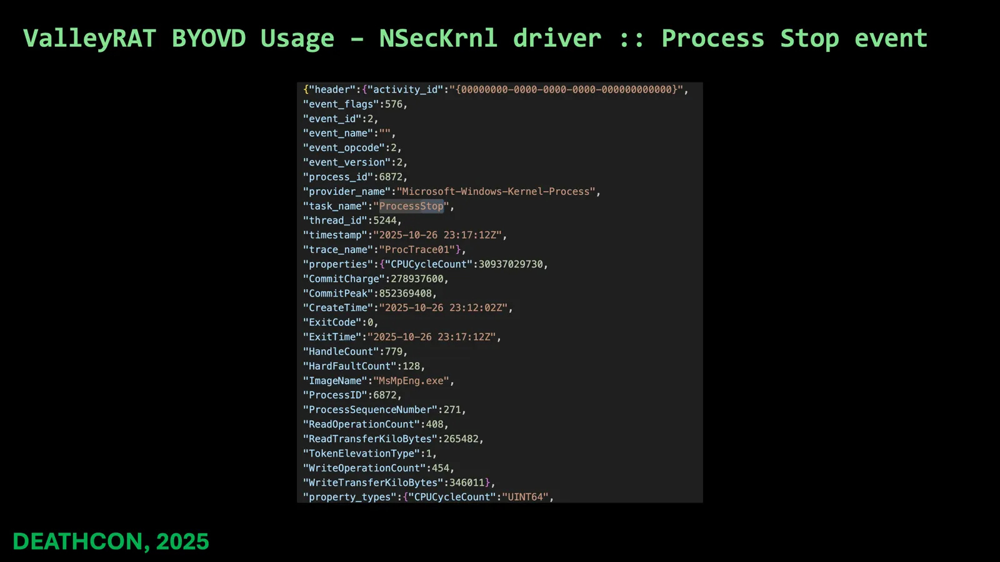
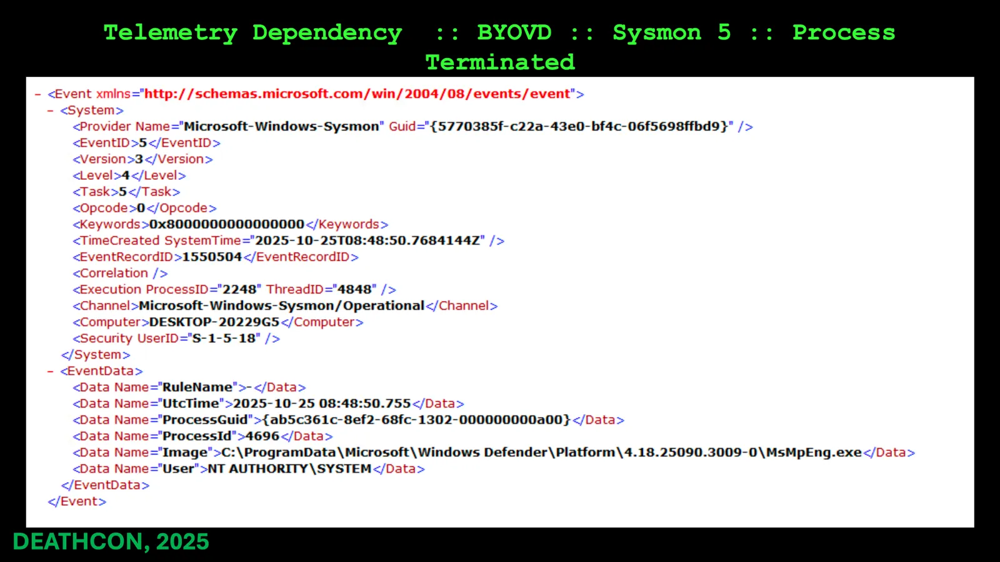
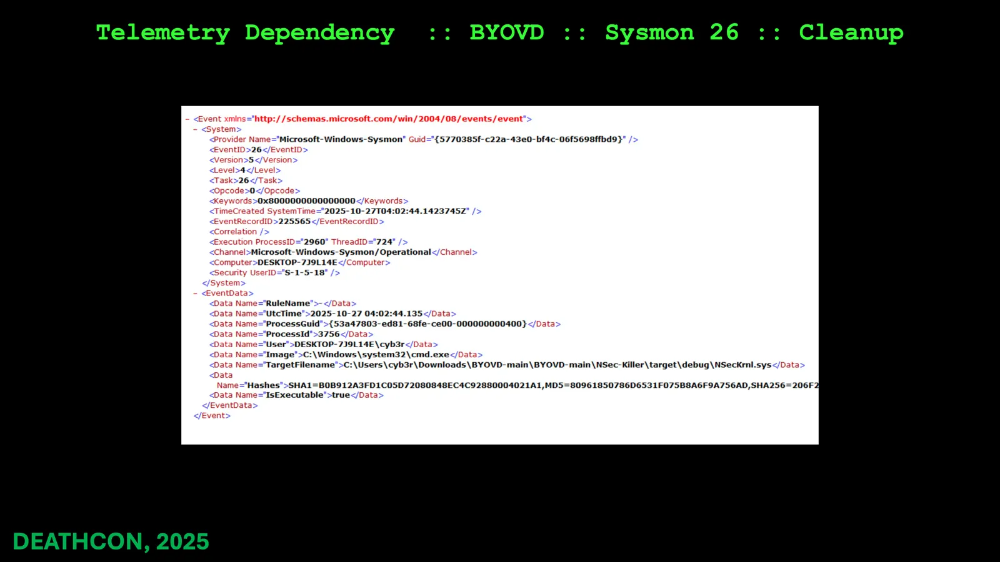